## Importing packages

In [4]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import tqdm
from optht import optht
import imageio
from skimage import data
from skimage.color import rgb2gray
import matplotlib.image as mpimg
import math
import plotly.express as px  #visualisation
import plotly.graph_objects as go #visualisation

import warnings # Ignore alert messages
warnings.simplefilter(action='ignore', category=FutureWarning)

np.seterr(divide='ignore')

{'divide': 'ignore', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

https://archive.ics.uci.edu/ml/datasets/wine+quality

In [5]:
df= pd.read_csv(r'data\winequalityN.csv')

Predict the quality of each wine sample, which can be low, medium, or high.<br>

-Low for less or equal to 5 <br>
-Medium between 6 and 7 <br>
-High for more then 7<br>

In [6]:
df

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [7]:
df.dtypes

type                     object
fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

In [8]:
#check null values
df.isnull().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [9]:
df['quality_label'] = df.quality.apply(lambda q: 'low' if q <= 5 else 'medium' if q <= 7 else 'high')

In [10]:
df

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,medium
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,medium
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,medium
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,medium
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,low
6493,red,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,NaN,11.2,6,medium
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,medium
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,low


In [11]:
df=df.dropna(axis=0)

In [12]:
df

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality_label
0,white,7.0,0.270,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,medium
1,white,6.3,0.300,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,medium
2,white,8.1,0.280,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,medium
3,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,medium
4,white,7.2,0.230,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6491,red,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6,medium
6492,red,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,low
6494,red,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,medium
6495,red,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,low


In [13]:
fig = px.scatter(df, x = 'fixed acidity', y = 'citric acid', color = 'quality_label')
fig.show()

<BarContainer object of 3 artists>

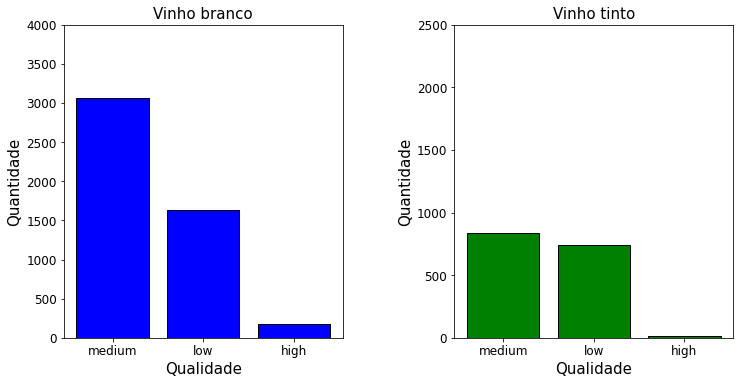

In [14]:
fig = plt.figure(figsize = (12, 6))
#title = fig.suptitle("Wine Type Vs Quality", fontsize=14)
fig.subplots_adjust(top=0.85, wspace=0.4)

ax1 = fig.add_subplot(1,2, 1)
ax1.set_title("Vinho branco",size=15)
ax1.set_xlabel("Qualidade",size=15)
ax1.set_ylabel("Quantidade",size=15) 
rw_q = df.quality_label[df.type == 'white'].value_counts()
rw_q = (list(rw_q.index), list(rw_q.values))
ax1.set_ylim([0, 4000])
ax1.tick_params(axis='both', which='major', labelsize=12)
ax1.bar(rw_q[0], rw_q[1], color='blue', edgecolor='black', linewidth=1)

ax2 = fig.add_subplot(1,2, 2)
ax2.set_title("Vinho tinto",size=15)
ax2.set_xlabel("Qualidade",size=15)
ax2.set_ylabel("Quantidade",size=15) 
ww_q = df.quality_label[df.type == 'red'].value_counts()
ww_q = (list(ww_q.index), list(ww_q.values))
ax2.set_ylim([0, 2500])
ax2.tick_params(axis='both', which='major', labelsize=12)
ax2.bar(ww_q[0], ww_q[1], color='green', edgecolor='black', linewidth=1)

O conjunto de dados é um bastante desbalanceado: <br>
- Existe uma maior quantidade de vinhos médios e ruins do que vinhos bons, isso é um problema pois o modelo vai tender a classificar como médio ou ruim. <br>
- Talver seja necessário balancear artificalmente esses dados.

In [15]:
df_red= df.loc[(df['type']=='red')]
df_white= df.loc[(df['type']=='white')]
df_red = df_red.reset_index(level=0)
df_white = df_white.reset_index(level=0)
df_white['index1'] = df_white.index
df_red['index1'] = df_red.index

In [16]:
df_red.describe()

,index,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,index1
count,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000,1593.000000
mean,5694.303829,8.326365,0.527659,0.271551,2.538512,0.087497,15.841808,46.463905,0.996752,3.310590,0.657866,10.419617,5.636535,796.000000
std,460.485183,1.740681,0.179297,0.194843,1.412061,0.047134,10.436038,32.913696,0.001888,0.154305,0.169716,1.065206,0.807687,460.003804
min,4898.000000,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000,0.000000
25%,5296.000000,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000,398.000000
50%,5694.000000,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000,796.000000
75%,6092.000000,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997850,3.400000,0.730000,11.100000,6.000000,1194.000000
max,6496.000000,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000,1592.000000


Variância muito grande para: <br>
- Free sulfur dioxide <br>
- total sulfur dioxide <br>
 

In [17]:
df_white.describe()

,index,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,index1
count,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000,4870.000000
mean,2457.259138,6.855123,0.278071,0.334199,6.394343,0.045771,35.317146,138.340144,0.994026,3.188154,0.489700,10.516772,5.878029,2434.500000
std,1409.940147,0.843444,0.100528,0.120915,5.070853,0.021846,17.012967,42.490515,0.002993,0.150902,0.114196,1.231251,0.885699,1405.992236
min,0.000000,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000,0.000000
25%,1241.250000,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991720,3.090000,0.410000,9.500000,5.000000,1217.250000
50%,2458.500000,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993735,3.180000,0.470000,10.400000,6.000000,2434.500000
75%,3677.750000,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000,3651.750000
max,4897.000000,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000,4869.000000


Variância muito grande para: <br>
- Free sulfur dioxide <br>
- total sulfur dioxide <br>
- residual sugar <br>

Comparando o vinho branco com vinho tinto é possível tirar algumas conclusões: <br>
- Média de açúcar resídual muito maior para o vinho branco do que para o vinho tinto;<br>


# Red Wine

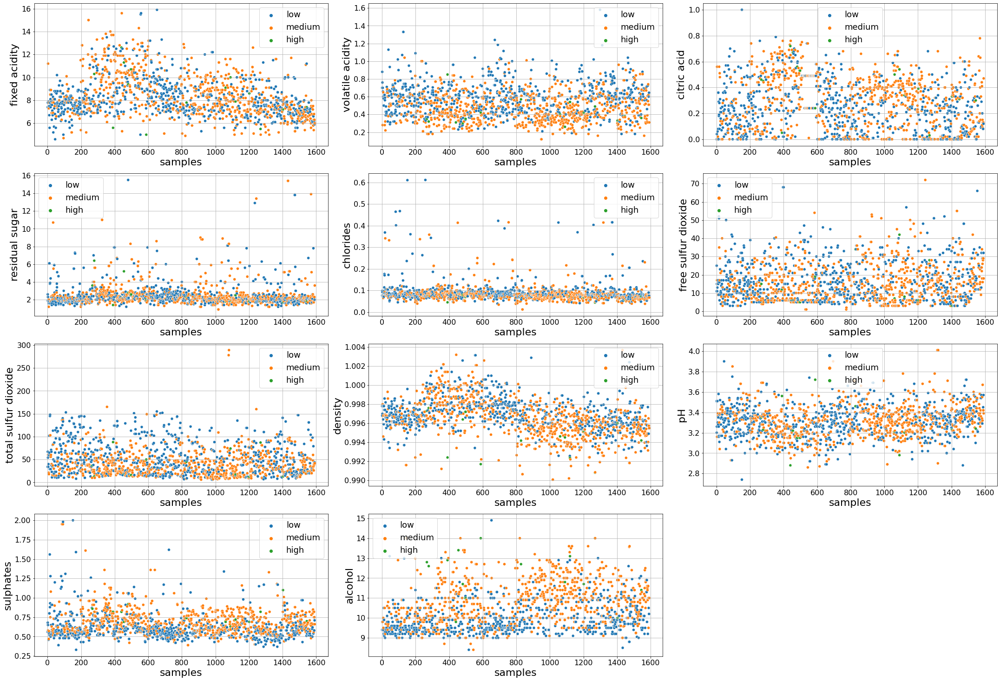

In [18]:
plt.rcParams.update({'figure.figsize': (30, 30)})

df_red_plot = df_red[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol','quality_label','index1']]
col = df_red_plot.columns
for i in range(0,len(col)-2):
    plt.subplot(6, 3, i+1)
    sns.scatterplot(data = df_red_plot, x='index1' ,y= df_red_plot.columns[i], hue = 'quality_label')      
    plt.xlabel('samples',fontsize=22)
    plt.ylabel(df_red_plot.columns[i],fontsize=22)
    locs, labels = plt.xticks()
    plt.tick_params(axis='x', which='major', labelsize=16)
    plt.tick_params(axis='y', which='major', labelsize=16)
    plt.tight_layout()
    plt.legend(fontsize=18)
    plt.grid()

Valores estranhos no açúcar residual, total sulfur dioxide, 

## White wine

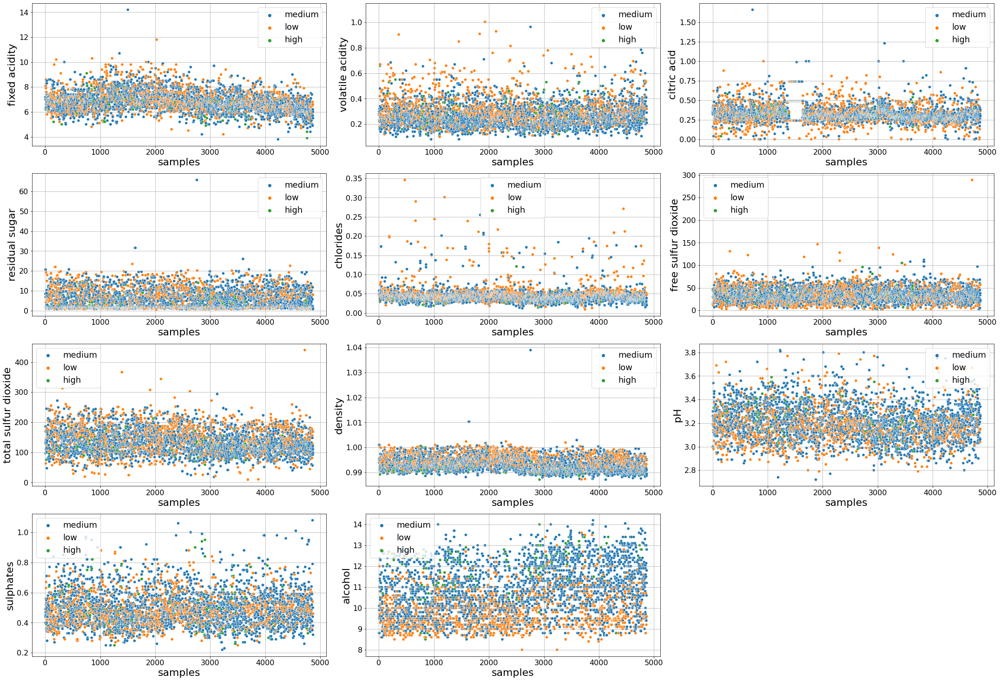

In [19]:
plt.rcParams.update({'figure.figsize': (30, 30)})

df_white_plot = df_white[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol','quality_label','index1']]
col = df_white_plot.columns
for i in range(0,len(col)-2):
    plt.subplot(6, 3, i+1)
    sns.scatterplot(data = df_white_plot, x='index1' ,y= df_white_plot.columns[i], hue = 'quality_label')      
    plt.xlabel('samples',fontsize=22)
    plt.ylabel(df_white_plot.columns[i],fontsize=22)
    locs, labels = plt.xticks()
    plt.tick_params(axis='x', which='major', labelsize=16)
    plt.tick_params(axis='y', which='major', labelsize=16)
    plt.tight_layout()
    plt.legend(fontsize=18)
    plt.grid()

Tem alguns valores  muito estranhos na desidade, residual sugar, total sulfur dioxide, free sulfur dioxide, citrica and fixed acidity

## Outlier Removal

In [20]:
def outlier_2nan(df, x, factor=1.5):
    fator = factor
    q3, q1 = np.percentile(df[x], [75, 25])
    iqr = q3 - q1
    lowpass = q1 - (iqr*fator)
    highpass = q3 + (iqr*fator)
    df[x].loc[(df[x] < lowpass) | (df[x] > highpass)] = np.nan

In [21]:
df_num = df_red[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']]
for i in df_num:
    fig = px.box(df_num, x = df_num[i])
    fig.update_traces(fillcolor = '#C9A26B')
    fig.show()

In [22]:
df_num = df_white[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']]
for i in df_num:
    fig = px.box(df_num, x = df_num[i])
    fig.update_traces(fillcolor = '#C9A26B')
    fig.show()

### outlier removal for red wine

In [23]:
df2 = df_red[['residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide','sulphates']]
df3 = df_red[['fixed acidity', 'volatile acidity', 'citric acid','density', 'pH', 'alcohol',
       'quality', 'quality_label']]

In [24]:
# Remover outliers
for c in df2.columns:
    outlier_2nan(df2, c, factor=2.5)
df_removal = pd.concat([df2,df3],axis=1)
df_removal.dropna(inplace=True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_3700\893496294.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [25]:
df_removal['index1'] = df_removal.index

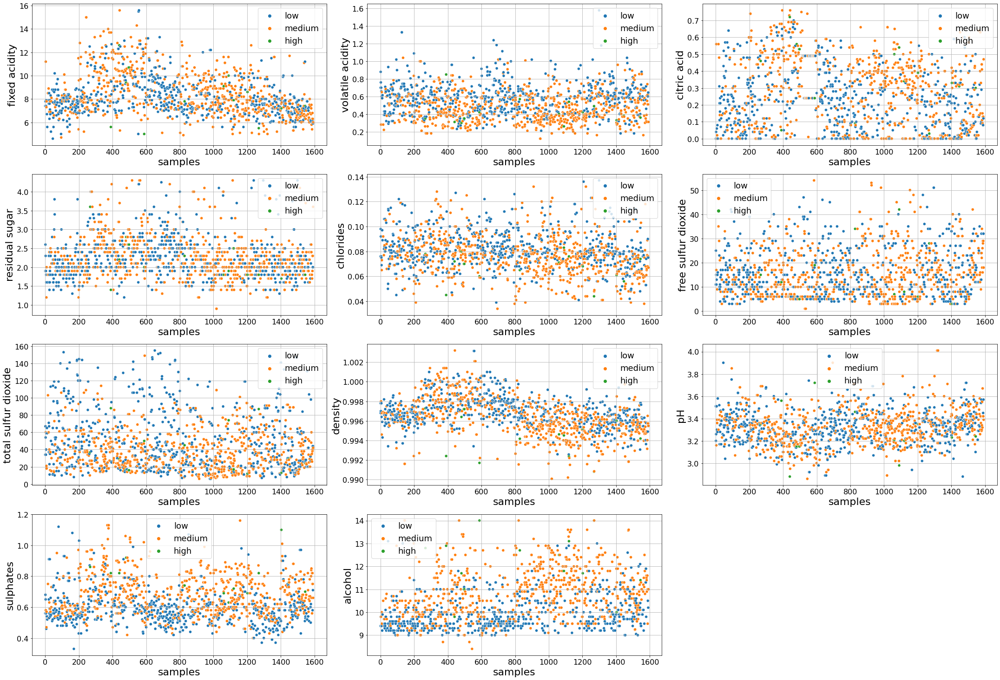

In [26]:
plt.rcParams.update({'figure.figsize': (30, 30)})
df_red = df_removal
df_red_plot = df_red[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol','quality_label','index1']]
col = df_red_plot.columns
for i in range(0,len(col)-2):
    plt.subplot(6, 3, i+1)
    sns.scatterplot(data = df_red_plot, x='index1' ,y= df_red_plot.columns[i], hue = 'quality_label')      
    plt.xlabel('samples',fontsize=22)
    plt.ylabel(df_red_plot.columns[i],fontsize=22)
    locs, labels = plt.xticks()
    plt.tick_params(axis='x', which='major', labelsize=16)
    plt.tick_params(axis='y', which='major', labelsize=16)
    plt.tight_layout()
    plt.legend(fontsize=18)
    plt.grid()

In [27]:
df_num = df_red[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']]
for i in df_num:
    fig = px.box(df_num, x = df_num[i])
    fig.update_traces(fillcolor = '#C9A26B')
    fig.show()

### outlier removal for white wine

In [28]:
df_white.columns

Index(['index', 'type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol',
       'quality', 'quality_label', 'index1'],
      dtype='object')

In [29]:
df2 = df_white[['fixed acidity','citric acid','residual sugar','free sulfur dioxide',
       'total sulfur dioxide','density']]
df3 = df_white[['volatile acidity', 'chlorides','sulphates', 'pH', 'alcohol','quality_label']]

In [30]:
# Remover outliers
for c in df2.columns:
    outlier_2nan(df2, c, factor=2.5)
df_removal = pd.concat([df2,df3],axis=1)
df_removal.dropna(inplace=True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_3700\893496294.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
df_removal['index1'] = df_removal.index

In [32]:
df_white.shape

(4870, 16)

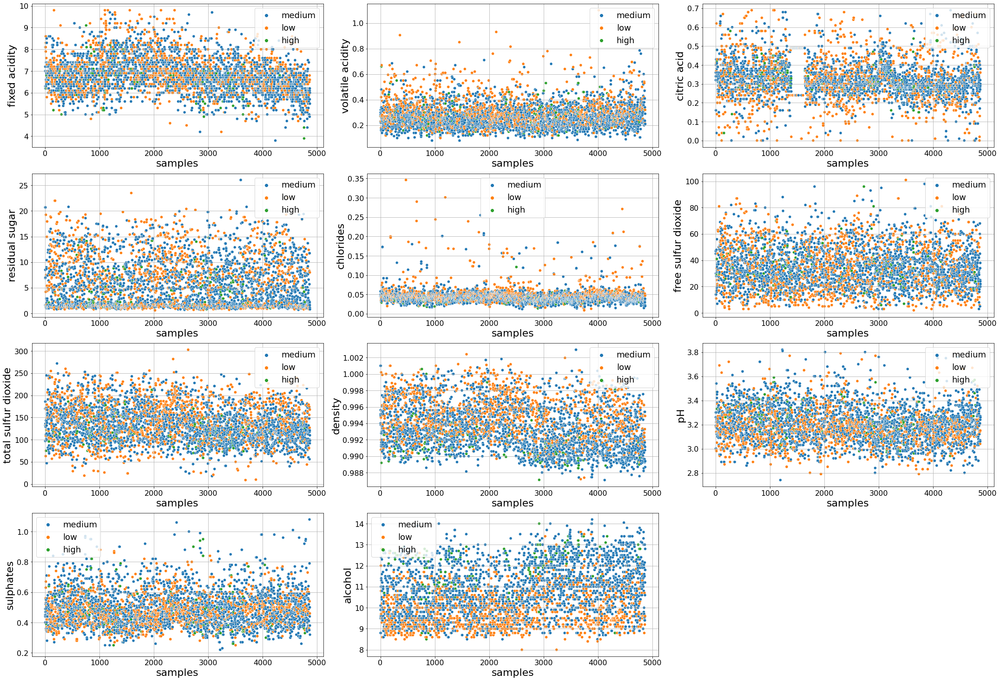

In [33]:
plt.rcParams.update({'figure.figsize': (30, 30)})
df_white = df_removal
df_white_plot = df_white[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol','quality_label','index1']]
col = df_white_plot.columns
for i in range(0,len(col)-2):
    plt.subplot(6, 3, i+1)
    sns.scatterplot(data = df_white_plot, x='index1' ,y= df_white_plot.columns[i], hue = 'quality_label')      
    plt.xlabel('samples',fontsize=22)
    plt.ylabel(df_white_plot.columns[i],fontsize=22)
    locs, labels = plt.xticks()
    plt.tick_params(axis='x', which='major', labelsize=16)
    plt.tick_params(axis='y', which='major', labelsize=16)
    plt.tight_layout()
    plt.legend(fontsize=18)
    plt.grid()

In [34]:
df_num = df_white[['fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol']]
for i in df_num:
    fig = px.box(df_num, x = df_num[i])
    fig.update_traces(fillcolor = '#C9A26B')
    fig.show()

In [35]:
df_red[df_red['quality_label'] == 'low'].describe()

,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,sulphates,fixed acidity,volatile acidity,citric acid,density,pH,alcohol,quality,index1
count,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000,645.000000
mean,2.249690,0.081836,15.972093,52.637209,0.587938,8.122791,0.589209,0.223659,0.996956,3.320124,9.923411,4.914729,764.806202
std,0.555841,0.014929,9.847872,35.484766,0.108750,1.537732,0.176538,0.173192,0.001542,0.149341,0.721408,0.311054,476.970312
min,1.200000,0.039000,3.000000,6.000000,0.330000,4.600000,0.180000,0.000000,0.992560,2.880000,9.000000,3.000000,0.000000
25%,1.900000,0.074000,8.000000,23.000000,0.520000,7.100000,0.460000,0.070000,0.996060,3.220000,9.400000,5.000000,333.000000
50%,2.200000,0.080000,14.000000,42.000000,0.570000,7.800000,0.590000,0.210000,0.996850,3.310000,9.700000,5.000000,731.000000
75%,2.500000,0.090000,22.000000,72.000000,0.630000,8.900000,0.680000,0.330000,0.997800,3.410000,10.200000,5.000000,1233.000000
max,4.300000,0.137000,51.000000,155.000000,1.120000,15.600000,1.580000,0.700000,1.003150,3.900000,13.100000,5.000000,1591.000000


In [36]:
df_red[df_red['quality_label'] == 'medium'].describe()

,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,sulphates,fixed acidity,volatile acidity,citric acid,density,pH,alcohol,quality,index1
count,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000,745.000000
mean,2.246779,0.077062,15.260403,38.001342,0.680671,8.465369,0.474718,0.289893,0.996386,3.320470,10.841186,6.228188,847.395973
std,0.547860,0.016290,9.471766,22.315643,0.126282,1.874033,0.163580,0.198553,0.001971,0.152599,1.084169,0.419946,436.432104
min,0.900000,0.034000,1.000000,6.000000,0.400000,4.700000,0.120000,0.000000,0.990070,2.860000,8.400000,6.000000,3.000000
25%,1.900000,0.066000,7.000000,21.000000,0.590000,7.100000,0.350000,0.100000,0.995160,3.220000,10.000000,6.000000,449.000000
50%,2.200000,0.077000,14.000000,33.000000,0.660000,8.000000,0.460000,0.310000,0.996300,3.320000,10.800000,6.000000,912.000000
75%,2.500000,0.085000,21.000000,49.000000,0.760000,9.600000,0.580000,0.450000,0.997600,3.410000,11.600000,6.000000,1197.000000
max,4.300000,0.132000,54.000000,149.000000,1.160000,15.600000,1.040000,0.760000,1.003200,4.010000,14.000000,7.000000,1592.000000


In [37]:
df_red[df_red['quality_label'] == 'high'].describe()

,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,sulphates,fixed acidity,volatile acidity,citric acid,density,pH,alcohol,quality,index1
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.0,16.000000
mean,2.175000,0.067062,14.250000,35.625000,0.769375,8.287500,0.417500,0.370000,0.994839,3.272500,11.981250,8.0,882.750000
std,0.543446,0.011428,11.486224,26.196374,0.120414,2.076174,0.143085,0.198057,0.002241,0.212963,1.246445,0.0,430.300283
min,1.400000,0.044000,3.000000,12.000000,0.630000,5.000000,0.260000,0.030000,0.990800,2.880000,9.800000,8.0,267.000000
25%,1.800000,0.060750,6.000000,16.000000,0.690000,7.200000,0.345000,0.285000,0.993727,3.150000,11.225000,8.0,491.500000
50%,2.000000,0.070000,10.000000,26.500000,0.740000,7.900000,0.370000,0.365000,0.994670,3.230000,11.750000,8.0,944.500000
75%,2.525000,0.074500,17.500000,46.250000,0.820000,9.550000,0.437500,0.530000,0.996600,3.377500,12.825000,8.0,1218.750000
max,3.600000,0.083000,42.000000,88.000000,1.100000,12.600000,0.850000,0.720000,0.998700,3.720000,14.000000,8.0,1545.000000


### Some conclusions about red wine: <br>
- The HIGHER the quality: <br>
- LOWER Chlorides <br>
- LOWER residual sugar <br>
- LOWER free sulfur dioxide <br>
- LOWER total suçfur dioxide <br>
- HIGHER sulphates <br>
- LOWER volatile acidity <br>
- HIGHER citric acidity <br>
- HIGHER alcohol <br>

In [38]:
df_white[df_white['quality_label'] == 'low'].describe()

,fixed acidity,citric acid,residual sugar,free sulfur dioxide,total sulfur dioxide,density,volatile acidity,chlorides,sulphates,pH,alcohol,index1
count,1574.000000,1574.000000,1574.000000,1574.000000,1574.00000,1574.000000,1574.000000,1574.000000,1574.000000,1574.000000,1574.00000,1574.000000
mean,6.933291,0.323945,6.997109,34.563215,147.31385,0.995104,0.309584,0.051148,0.479530,3.173151,9.86298,2318.506353
std,0.853634,0.128157,5.255624,18.138760,45.42986,0.002542,0.110325,0.026049,0.098735,0.142015,0.88318,1385.116793
min,4.200000,0.000000,0.600000,2.000000,9.00000,0.987220,0.100000,0.009000,0.250000,2.790000,8.00000,10.000000
25%,6.400000,0.240000,1.700000,20.000000,116.00000,0.993160,0.240000,0.040000,0.410000,3.080000,9.20000,1114.250000
50%,6.800000,0.310000,6.600000,34.000000,148.00000,0.995120,0.290000,0.047000,0.470000,3.160000,9.60000,2240.000000
75%,7.400000,0.400000,10.900000,48.000000,181.00000,0.996990,0.350000,0.053000,0.530000,3.240000,10.40000,3579.750000
max,9.800000,0.690000,23.500000,101.000000,303.00000,1.002400,1.100000,0.346000,0.880000,3.790000,13.60000,4867.000000


In [39]:
df_white[df_white['quality_label'] == 'medium'].describe()

,fixed acidity,citric acid,residual sugar,free sulfur dioxide,total sulfur dioxide,density,volatile acidity,chlorides,sulphates,pH,alcohol,index1
count,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000,3004.000000
mean,6.795389,0.327324,6.038166,35.119840,133.235020,0.993483,0.260962,0.042855,0.494351,3.196401,10.811668,2521.726698
std,0.794416,0.091164,4.775088,14.863474,39.243277,0.002889,0.087946,0.017532,0.118704,0.152698,1.227928,1425.180747
min,3.800000,0.000000,0.700000,3.000000,18.000000,0.987110,0.080000,0.012000,0.220000,2.740000,8.500000,0.000000
25%,6.300000,0.270000,1.700000,25.000000,105.000000,0.991200,0.200000,0.034000,0.410000,3.090000,9.800000,1265.750000
50%,6.800000,0.310000,4.800000,33.000000,128.000000,0.993000,0.250000,0.041000,0.480000,3.190000,10.800000,2635.500000
75%,7.300000,0.370000,9.200000,44.625000,158.000000,0.995460,0.310000,0.048000,0.560000,3.290000,11.800000,3734.250000
max,9.700000,0.690000,26.050000,98.000000,272.000000,1.002950,0.785000,0.255000,1.080000,3.820000,14.200000,4869.000000


In [40]:
df_white[df_white['quality_label'] == 'high'].describe()

,fixed acidity,citric acid,residual sugar,free sulfur dioxide,total sulfur dioxide,density,volatile acidity,chlorides,sulphates,pH,alcohol,index1
count,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000,176.000000
mean,6.678977,0.325284,5.632955,35.965909,125.568182,0.992224,0.276847,0.037977,0.485625,3.222386,11.645455,2252.863636
std,0.838952,0.079949,4.245043,14.504343,32.371388,0.002809,0.103793,0.013264,0.146540,0.151608,1.284671,1307.952950
min,3.900000,0.040000,0.800000,6.000000,59.000000,0.987130,0.120000,0.014000,0.250000,2.940000,8.500000,19.000000
25%,6.200000,0.280000,2.075000,28.000000,102.750000,0.990260,0.200000,0.030000,0.380000,3.130000,11.000000,1079.250000
50%,6.800000,0.320000,4.300000,34.500000,122.000000,0.991575,0.260000,0.035000,0.460000,3.230000,12.000000,2362.500000
75%,7.300000,0.360000,8.150000,43.250000,148.000000,0.993478,0.330000,0.044000,0.580000,3.330000,12.600000,3354.000000
max,9.100000,0.580000,14.800000,96.000000,212.500000,1.000600,0.660000,0.121000,0.950000,3.590000,14.000000,4776.000000


### Some conclusions about white wine: <br>
- The HIGHER the quality: <br>
- LOWER Chlorides <br>
- LOWER residual sugar <br>
- HIGHER free sulfur dioxide <br>
- LOWER total sulfur dioxide <br>
- HIGHER alcohol <br>

In [41]:
df_white.columns

Index(['fixed acidity', 'citric acid', 'residual sugar', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'volatile acidity', 'chlorides',
       'sulphates', 'pH', 'alcohol', 'quality_label', 'index1'],
      dtype='object')

In [42]:
df_white['type'] = 'white'
df_red['type'] = 'red'

In [43]:
df_white = df_white[['type','fixed acidity', 'citric acid', 'residual sugar', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'volatile acidity', 'chlorides',
       'sulphates', 'pH', 'alcohol', 'quality_label']]
df_red = df_red[['type','fixed acidity', 'citric acid', 'residual sugar', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'volatile acidity', 'chlorides',
       'sulphates', 'pH', 'alcohol', 'quality_label']]

In [44]:
df_clean = pd.concat([df_white,df_red],axis=0)

In [45]:
df_clean

,type,fixed acidity,citric acid,residual sugar,free sulfur dioxide,total sulfur dioxide,density,volatile acidity,chlorides,sulphates,pH,alcohol,quality_label
0,white,7.0,0.36,20.7,45.0,170.0,1.00100,0.270,0.045,0.45,3.00,8.8,medium
1,white,6.3,0.34,1.6,14.0,132.0,0.99400,0.300,0.049,0.49,3.30,9.5,medium
2,white,8.1,0.40,6.9,30.0,97.0,0.99510,0.280,0.050,0.44,3.26,10.1,medium
3,white,7.2,0.32,8.5,47.0,186.0,0.99560,0.230,0.058,0.40,3.19,9.9,medium
4,white,7.2,0.32,8.5,47.0,186.0,0.99560,0.230,0.058,0.40,3.19,9.9,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1588,red,6.8,0.08,1.9,28.0,38.0,0.99651,0.620,0.068,0.82,3.42,9.5,medium
1589,red,6.2,0.08,2.0,32.0,44.0,0.99490,0.600,0.090,0.58,3.45,10.5,low
1590,red,6.3,0.13,2.3,29.0,40.0,0.99574,0.510,0.076,0.75,3.42,11.0,medium
1591,red,5.9,0.12,2.0,32.0,44.0,0.99547,0.645,0.075,0.71,3.57,10.2,low


In [46]:
df_clean = df_clean.replace({'low': 0,'medium':1,'high':2})

In [47]:
df_clean.to_csv(r'data\Wine_quality_clean.csv', index=False)

In [48]:
df_clean[df_clean['type'] == 'red'].to_csv(r'data\Red_Wine_clean.csv', index=False)

In [49]:
df_clean[df_clean['type'] == 'white'].to_csv(r'data\White_Wine_clean.csv', index=False)

In [50]:
df_r = df_clean[df_clean['type'] == 'red']
df_w = df_clean[df_clean['type'] == 'white']

In [51]:
def heat_map(data,method):
    sns.set(font_scale=1.1)
    corr=data.corr(method=method)
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    plt.figure(figsize=(10,10))
    sns.heatmap(corr,cmap="coolwarm", linewidths=0.5, annot=True, annot_kws={"size":10},mask=mask,square=True,cbar=False)
    plt.show()

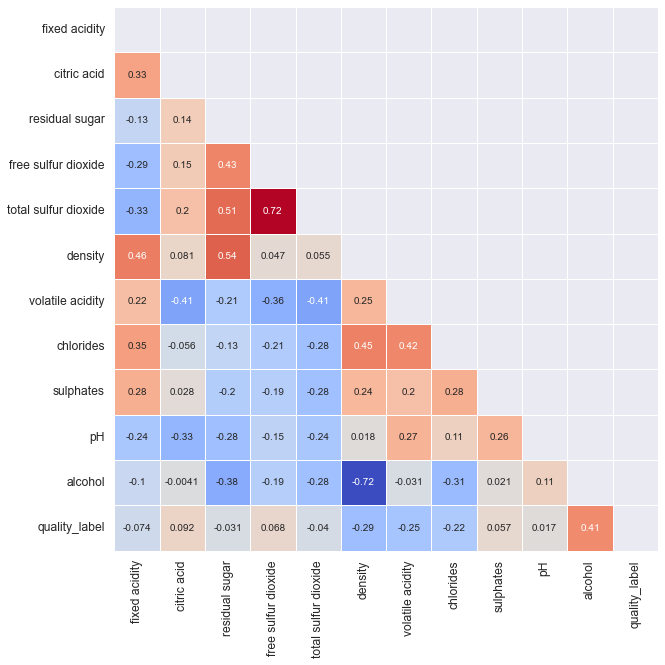

In [52]:
heat_map(df_clean, 'pearson')

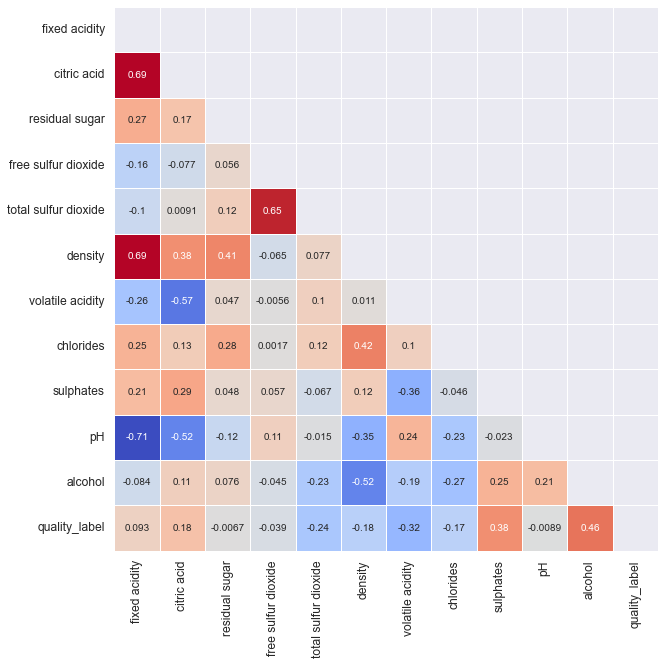

In [53]:
heat_map(df_r, 'pearson')

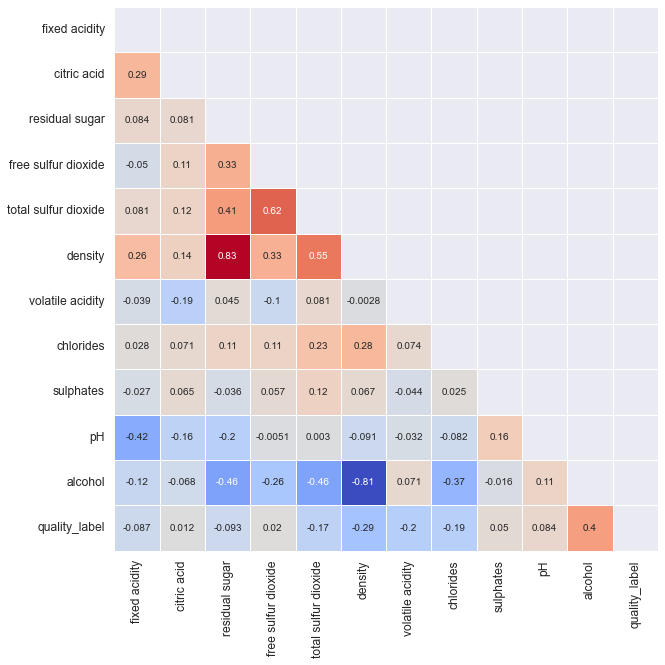

In [54]:
heat_map(df_w, 'pearson')

In [55]:
import ppscore as pps
pps.matrix(df_r)

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,type,type,1.000000,predict_itself,True,None,0.000000,1.000000,None
1,type,fixed acidity,0.000000,regression,True,mean absolute error,1.309459,1.351723,DecisionTreeRegressor()
2,type,citric acid,0.000000,regression,True,mean absolute error,0.161060,0.161500,DecisionTreeRegressor()
3,type,residual sugar,0.000000,regression,True,mean absolute error,0.401636,0.409850,DecisionTreeRegressor()
4,type,free sulfur dioxide,0.000000,regression,True,mean absolute error,7.561166,7.716703,DecisionTreeRegressor()
...,...,...,...,...,...,...,...,...,...
164,quality_label,chlorides,0.008354,regression,True,mean absolute error,0.011932,0.011832,DecisionTreeRegressor()
165,quality_label,sulphates,0.062386,regression,True,mean absolute error,0.098115,0.091994,DecisionTreeRegressor()
166,quality_label,pH,0.000000,regression,True,mean absolute error,0.117774,0.118089,DecisionTreeRegressor()
167,quality_label,alcohol,0.134590,regression,True,mean absolute error,0.851268,0.736697,DecisionTreeRegressor()


<AxesSubplot:xlabel='x', ylabel='y'>

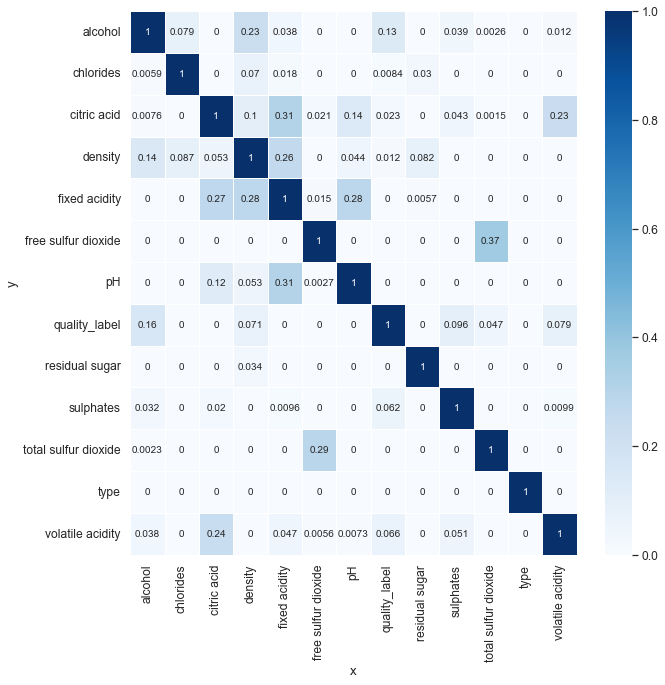

In [56]:
matrix_df = pps.matrix(df_r)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')
sns.set(font_scale=1.1)
plt.figure(figsize=(10,10))
sns.heatmap(matrix_df, vmin=0, vmax=1, cmap="Blues", linewidths=0.5, annot=True,annot_kws={"size":10})